# Final Model Test Against the Asteroid Bennu

Stages: 

- Predict every bennu image
- stich the images together
- Save the prediction total image out as a .npy
- Visualize the prediction map (is 0.5 a good threshold?)
- Visualize the prediction map over the mosiac
- Smooth predictions out if sharpness in predictions are too much (maybe?)
- See if the model picked up on the landing spots that NASA chose

In [9]:
print('test')

test


In [1]:
import tensorflow as tf
import tensorflow.keras as Keras
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.image import per_image_standardization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from model_utils import generate_image_paths 
from model_utils import artificial_lunar_landscapes

from model_utils_sobel import generate_image_paths as generate_image_paths_processed
from model_utils_sobel import artificial_lunar_landscapes as artificial_lunar_landscapes_processsed

import re
import os
import cv2

In [11]:
def weighted_bincrossentropy(true, pred, weight_zero = 0.1, weight_one = 1):
    """
    Calculates weighted binary cross entropy. The weights are fixed.
        
    This can be useful for unbalanced catagories.
    
    Adjust the weights here depending on what is required.
    
    For example if there are 10x as many positive classes as negative classes,
        if you adjust weight_zero = 1.0, weight_one = 0.1, then false positives # predict rock but actually no rock
        will be penalize 10 times as much as false negatives. # predict no rock but actually rock
    """

    # calculate the binary cross entropy
    bin_crossentropy = keras.backend.binary_crossentropy(true, pred)
    
    # apply the weights
    weights = true * weight_one + (1. - true) * weight_zero
    weighted_bin_crossentropy = weights * bin_crossentropy 

    return keras.backend.mean(weighted_bin_crossentropy)

def wbce( y_true, y_pred, weight1=1, weight0=0.1 ) :
    y_true = K.clip(y_true, K.epsilon(), 1-K.epsilon())
    y_pred = K.clip(y_pred, K.epsilon(), 1-K.epsilon())
    logloss = -(y_true * K.log(y_pred) * weight1 + (1 - y_true) * K.log(1 - y_pred) * weight0 )
    return K.mean( logloss, axis=-1)

def iou_coef(y_true, y_pred, smooth=1):
  intersection = K.sum(K.abs(y_true * y_pred), axis=[1,2,3])
  union = K.sum(y_true,[1,2,3])+K.sum(y_pred,[1,2,3])-intersection
  iou = K.mean((intersection + smooth) / (union + smooth), axis=0)
  return 1-iou

### Load Sample Validation Images

## UNET

In [12]:
#model = load_model('model.20-0.07-0.86.h5', custom_objects={'weighted_bincrossentropy':weighted_bincrossentropy})
#model = load_model('D:/ProgrammingD/github/thesis/modeling/results/custom-modeling/y-model-2-unet/checkpoints/traintestrun-0.4bce/model.01-0.70-0.79.h5', custom_objects={'iou_coef':iou_coef})

model = load_model('C:/SynologyDrive/Education/Northwestern University/MSDS 453 - Thesis/thesis-wip/model-results/best-models/unet/model-16.h5', custom_objects={'weighted_bincrossentropy':weighted_bincrossentropy})

In [13]:
#img = load_img('D:/TJPersonalCloud/Programming/msds-thesis-data/data-ml/split-data/bennu-validation/3360_2160.jpg', color_mode='grayscale')
#img = load_img('D:/TJPersonalCloud/Programming/msds-thesis-data/data-ml/split-data/test/render-og/render7856.png', color_mode='grayscale')
img = load_img('1440_9360.jpg', grayscale=True)

In [2]:
#load mosaic
mosaic = load_img('C:/SynologyDrive/Programming/msds-thesis-data/data-ml/usga-bennu/Bennu_global_FB34_FB56_ShapeV28_GndControl_MinnaertPhase30_PAN_8bit_half.jpg', color_mode='grayscale')
mosaic = np.array(mosaic)

C:\Users\Taylo\anaconda3\envs\asteroid_thesis\lib\site-packages\PIL\Image.py:2847: DecompressionBombWarning: Image size (123370632 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


#### Preprocess Image

In [23]:
model_name = 'Unet'
batch_size = 1
image_size = (480,720,1)
input_dir = 'C:/SynologyDrive/Programming/msds-thesis-data/data-ml/split-data/bennu-validation'

input_dir, input_img_paths = generate_image_paths(
    input_dir=input_dir
)
test_generator = artificial_lunar_landscapes(
    batch_size=batch_size,
    image_size=image_size,
    input_img_paths=input_img_paths
)

Number of images:  374


In [16]:
results = model.predict(test_generator)


KeyboardInterrupt: 

In [9]:
# save results for each image
np.save(file=f'C:/SynologyDrive/Education/Northwestern University/MSDS 453 - Thesis/thesis-wip/model-results/model_results_images/{model_name}-bennu-array.npy', arr=results)

In [33]:
#results without sizing images back to original size
results_mosaic = np.zeros((8160,15840,1))
width = 8160
length = 15840
#results_mosaic = results.reshape((-1,8160,15840,1))
row = 0
col = 0

counter = 0
for row in range(0,width, 480):
    for col in range(0,length, 720):
        results_mosaic[row:row+480, col:col+720] = results[counter]
        counter += 1
np.save(file=f'C:/SynologyDrive/Education/Northwestern University/MSDS 453 - Thesis/thesis-wip/model-results/model_results_images/{model_name}-bennu-array-mosaic.npy', arr=results_mosaic)

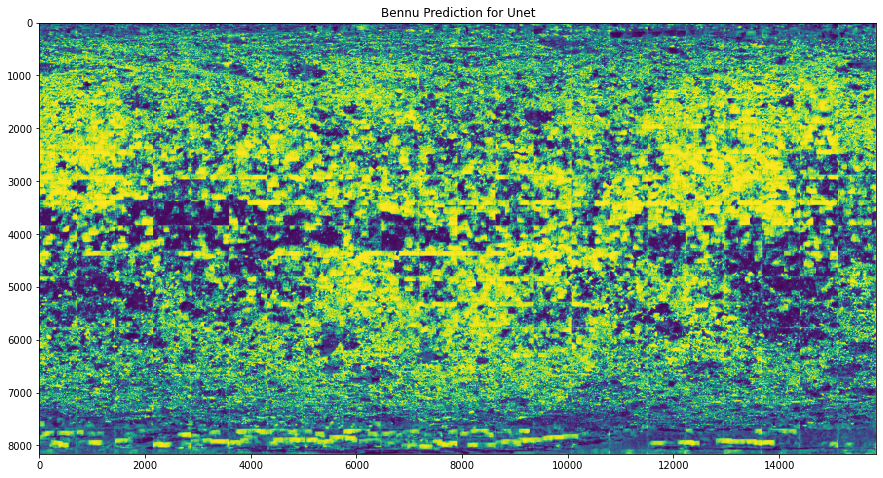

In [35]:
plt.figure(figsize=[15,15])
plt.imshow(results_mosaic)
plt.title(f"Bennu Prediction for {model_name}")
plt.show()

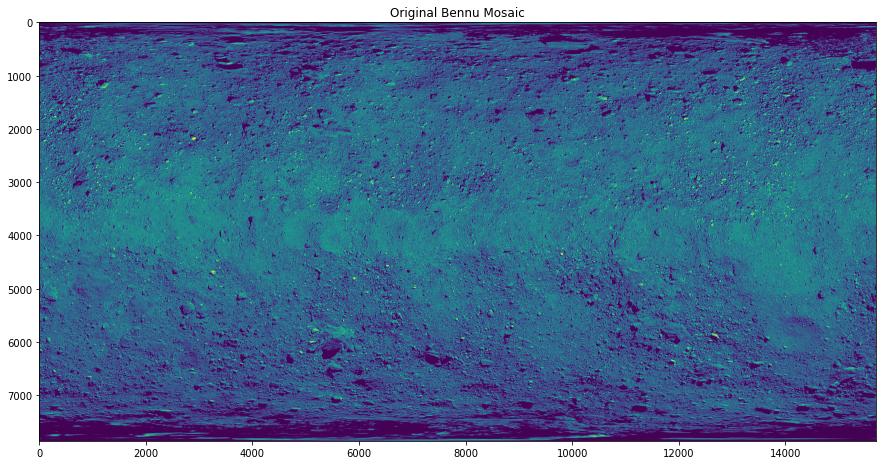

In [37]:
plt.figure(figsize=[15,15])
plt.imshow(mosaic)
plt.title("Original Bennu Mosaic")
plt.show()

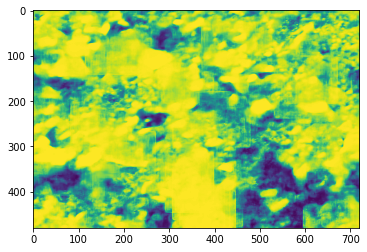

In [14]:
plt.imshow(model.predict(test_generator[50])[0])

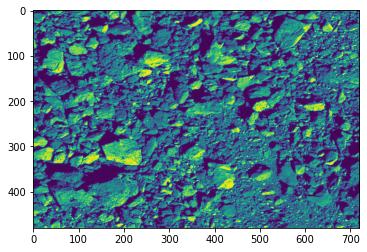

In [15]:
plt.imshow(test_generator[50][0])

In [ ]:
#resized image of bennu to fit prediction sizes
mosaic_resized = np.zeros((8160,15840,1))
width = 8160
length = 15840
#results_mosaic = results.reshape((-1,8160,15840,1))
row = 0
col = 0

counter = 0
for row in range(0,width, 480):
    for col in range(0,length, 720):
        mosaic_resized[row:row+480, col:col+720] = test_generator[counter]
        counter += 1
np.save(file=f'C:/SynologyDrive/Education/Northwestern University/MSDS 453 - Thesis/thesis-wip/model-results/model_results_images/bennu-array-mosaic-resized-to-predictions.npy', arr=results_mosaic)

## MISC VISUAL TESTING

In [15]:
results = np.load('C:/SynologyDrive/Education/Northwestern University/MSDS 453 - Thesis/thesis-wip/model-results/model_results_images/unet-bennu-array.npy')
results_mosaic = np.load('C:/SynologyDrive/Education/Northwestern University/MSDS 453 - Thesis/thesis-wip/model-results/model_results_images/Unet-bennu-array-mosaic.npy')
mosaic_resized = np.load('C:/SynologyDrive/Education/Northwestern University/MSDS 453 - Thesis/thesis-wip/model-results/model_results_images/bennu-array-mosaic-resized-to-predictions.npy')
mosaic_color = load_img('C:/SynologyDrive/Programming/msds-thesis-data/data-ml/usga-bennu/Bennu_global_FB34_FB56_ShapeV28_GndControl_MinnaertPhase30_PAN_8bit_half.jpg')
mosaic_color = np.array(mosaic_color)

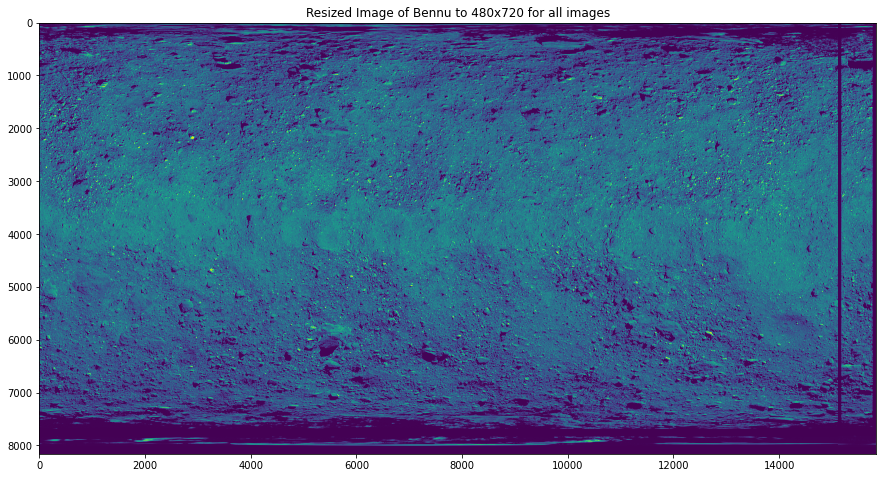

In [33]:
plt.figure(figsize=[15,15])
plt.imshow(mosaic_resized)
plt.title("Resized Image of Bennu to 480x720 for all images")
plt.show()

### Merging the predictions with image

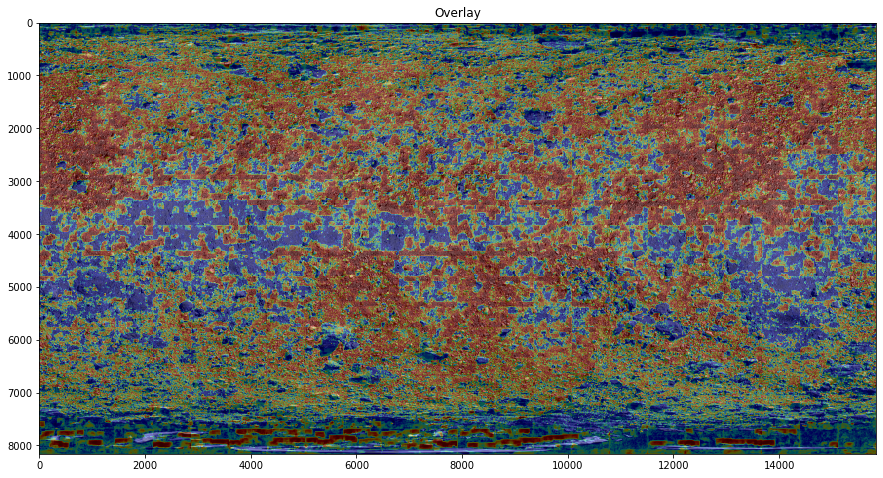

In [26]:
plt.figure(figsize=[15,15])
plt.imshow(mosaic_resized, cmap='gray')
plt.imshow(results_mosaic, cmap='jet', alpha=0.35)
plt.title("Overlay")
plt.show()

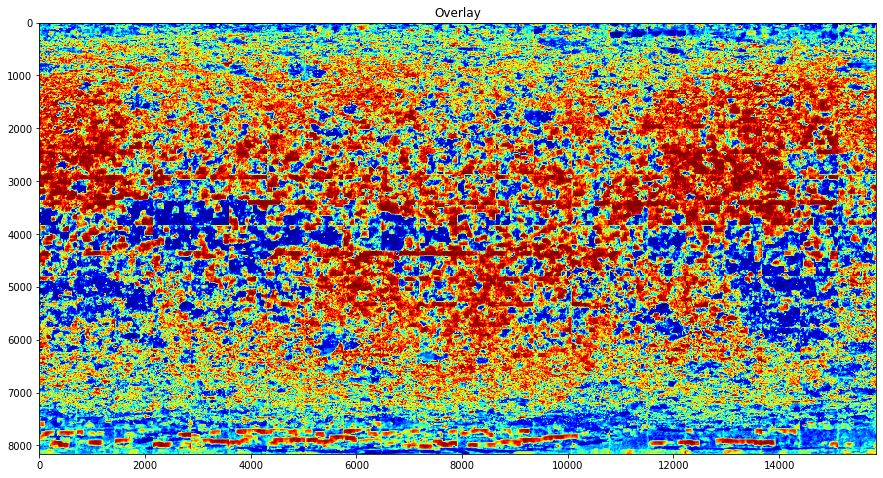

In [40]:
plt.figure(figsize=[15,15])
plt.imshow(results_mosaic, cmap='jet', alpha=1)
plt.title("Overlay")
plt.show()